In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!ls /content/drive/MyDrive/

 0f5d06b2-8232-44ab-8cff-4e4d20933096.jpg
'0-Religiousness-and-secularism (1).zip'
 0-Religiousness-and-secularism.zip
 14375aff-94b2-4f2e-a355-1b7391e70b6b.jpg
 2016-07-08-PHOTO-00000005.jpg
 7c64e28e-954a-4932-a732-164c175c5498.jpg
'Abstract 22-11-2019[17726] Sara.odt'
'Antoun Helal.gdoc'
 Aquarius.docx
'Attestation de réussite.pdf'
'Attestation d’hebergement .gdoc'
'Attestation d’hebergement .pdf'
 AttestationDroits.pdf
 Attestation_locataire_204_RUE_CHAMPIONNET_75018_PARIS.pdf
'attestation Sara Jabali.docx'
'attestation Sara Jabali.gdoc'
'attestation Sara Jabali.pdf'
 Azza
'BIA PORTABILITE.gdoc'
'BIA PORTABILITE.pdf'
'Blank 7.pages'
'Booking #1985890908.pdf'
'books 2.jpg'
 books.jpg
'Books TONI.gdoc'
'Brève .docx'
 Brochure.gdoc
 CAF
'Chrome OS Cloud backup'
'Chrome Syncable FileSystem'
'Coffee Table Art Material'
'Colab Notebooks'
'Contrat Sara.pdf'
'Copy of Lettre de motivation linguistique.docx'
'cours norme et usage.gdoc'
'-Croissance économique et Hezbollah.gdoc'
' CV 2021-

In [4]:
!ls /content/drive/MyDrive/Colab\ Notebooks

 challenge1.ipynb	     Exercise1+2+3w2d3.ipynb   'Flower Classification.zip'
 challenge2.ipynb	     Exercise1.ipynb	        Foodie_Analysis.pptx
 challengepage1w2d3.ipynb   'Exercise 2.ipynb'	        Foodie_Analysis_Presentation.pptx
 challengepage2w2d3.ipynb    Exercise3.ipynb	        HackathonD5W3.ipynb
 ClassChallenge1D2W4.ipynb   Exercise4+5.ipynb	        MiniProjectW2.ipynb
 ClassChallenge3D2W4.ipynb   Exercise4w2d3.ipynb        MiniProjectW3.ipynb
 DailyChallengeD1W3.ipynb    Exercises1+2+3D2W2.ipynb   NOTES_D1W3.ipynb
 DailyChallengeD1W4.ipynb    Exercises4D2W2.ipynb       NOTES-D2W3.ipynb
 DailyChallengeD2W3.ipynb    Exercises5D2W2.ipynb       NOTES-D3W3.ipynb
 DailyChallengeD2W4.ipynb    Exercises6D2W2.ipynb       NOTES_plots_day4.ipynb
 DailyChallengeD3W3.ipynb    ExercisesD1W3.ipynb        test.ipynb
 DailyChallengeD4W2.ipynb    ExercisesD1W4.ipynb        TrainingD3W4.ipynb
 DailyChallengeD4W3.ipynb    ExercisesD2W3.ipynb        Untitled
 DailyChallenge.ipynb	    'ExercisesD

In [5]:
! unzip /content/drive/MyDrive/Colab\ Notebooks/Flower\ Classification.zip -d /content/Flower\ Classification

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: /content/Flower Classification/Data/train/iris/17779345575_de76cd0e3a_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/17826727169_991cf11676_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/17858672081_4b4d071116_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/17885928250_451875aec2_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/17948299355_2161a031db_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/17959086836_3e706d918b_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/18054931376_23052f68d0_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/18059533553_186ccb451a_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/18076633321_400ea17b5a_c.jpg  
  inflating: /content/Flower Classification/Data/train/iris/18120244292_ea11fcc9c5_c.jpg  
  inflating:

In [7]:
# Exercise 1: Data Exploration and Visualization
# 1. Objective: Familiarize yourself with the dataset.

In [6]:
# 2. Task:
# * Load the dataset using image_dataset_from_directory.
# * Print the number of images per class.
# * Modify the visualize_images function to display a grid of 3x3 images for each flower class. Ensure the class name is displayed as the title for each grid.
# * Analyze the images. What are some challenges you anticipate in classifying these flowers? (e.g., similar colors, shapes, variations within a species).

In [8]:
import tensorflow as tf
import os
import matplotlib.pyplot as plt
import numpy as np

In [9]:
# Path to dataset

train_dir = '/content/Flower Classification/Data/train'
val_dir = '/content/Flower Classification/Data/train'

In [10]:
# Load dataset
batch_size = 32
img_size = (180, 180)

train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    validation_split=0.2,
    subset="training",
    seed=123,
    image_size=(img_size),
    batch_size=batch_size
)

# Get class names
class_names = train_ds.class_names
print("Flower Classes:", class_names)

Found 13642 files belonging to 14 classes.
Using 10914 files for training.
Flower Classes: ['astilbe', 'bellflower', 'black_eyed_susan', 'calendula', 'california_poppy', 'carnation', 'common_daisy', 'coreopsis', 'dandelion', 'iris', 'rose', 'sunflower', 'tulip', 'water_lily']


In [11]:
# Initialize class counts
class_counts = {class_name: 0 for class_name in class_names}

# Count images per class
for images, labels in train_ds:
    for label in labels.numpy():
        class_counts[class_names[label]] += 1

# Print results
import pandas as pd
df_class_counts = pd.DataFrame(list(class_counts.items()), columns=["Class", "Image Count"])
print(df_class_counts)

               Class  Image Count
0            astilbe          579
1         bellflower          712
2   black_eyed_susan          769
3          calendula          808
4   california_poppy          806
5          carnation          746
6       common_daisy          803
7          coreopsis          822
8          dandelion          825
9               iris          839
10              rose          775
11         sunflower          830
12             tulip          822
13        water_lily          778


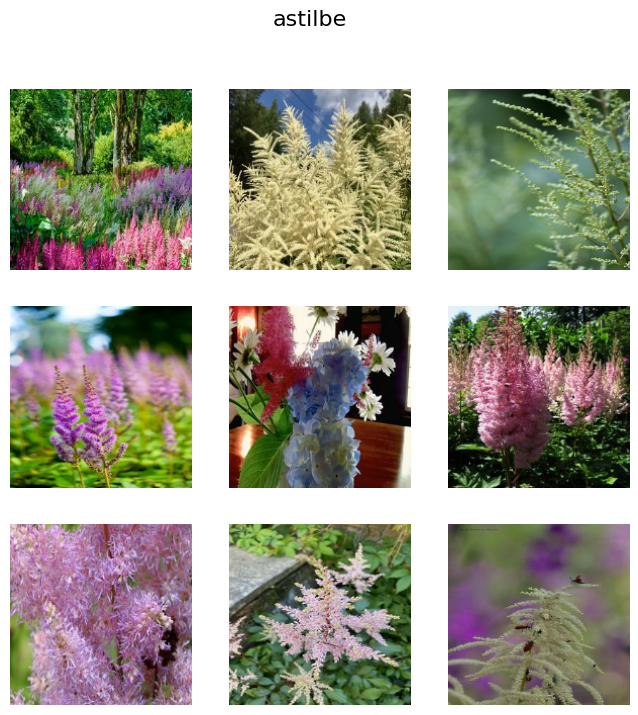

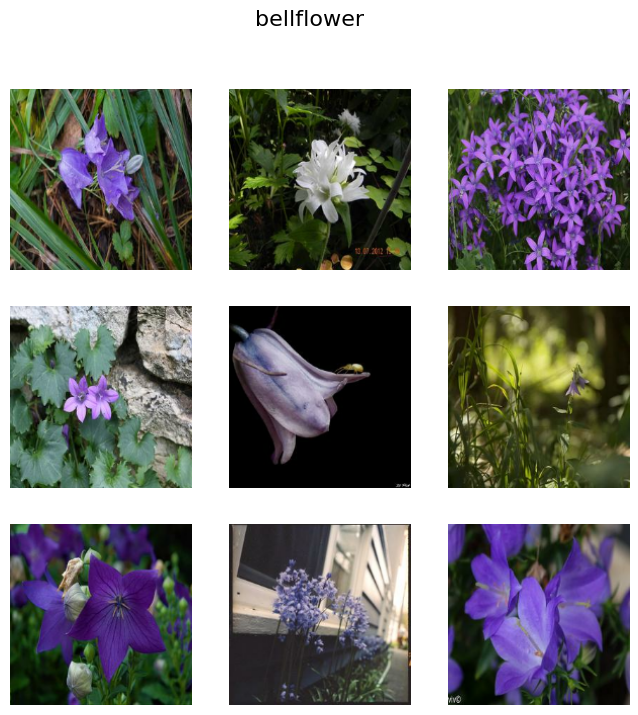

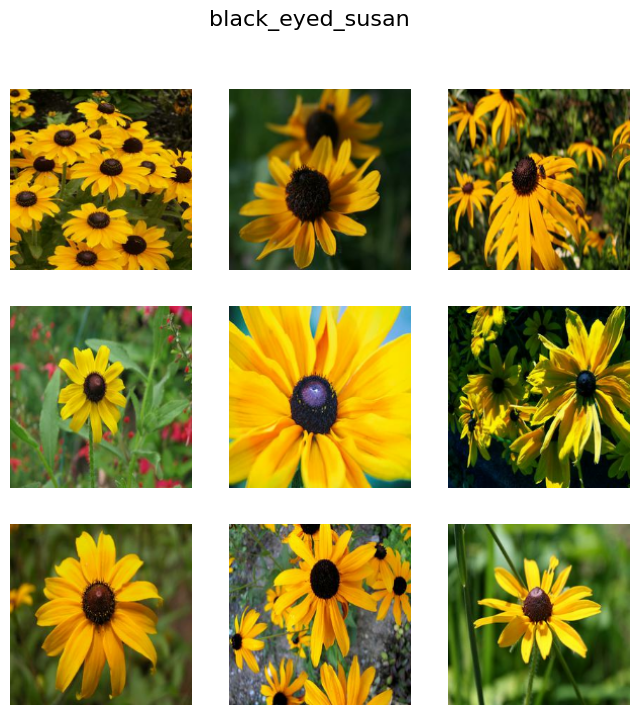

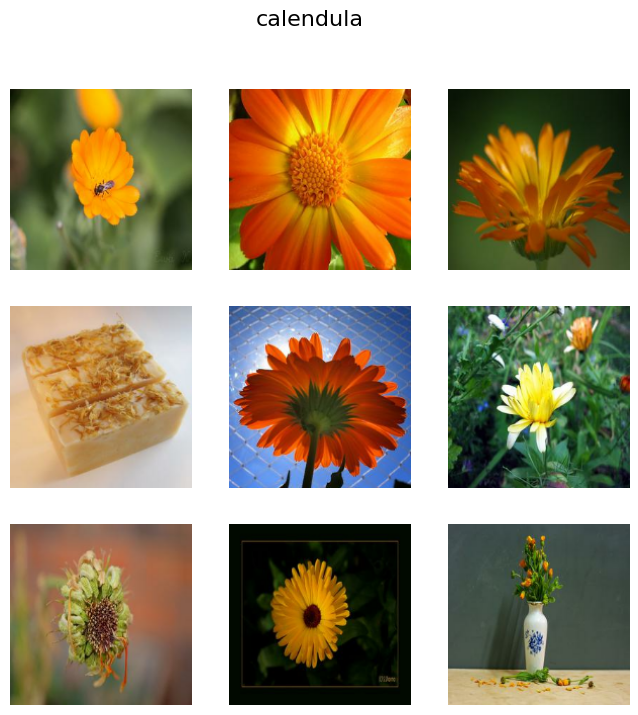

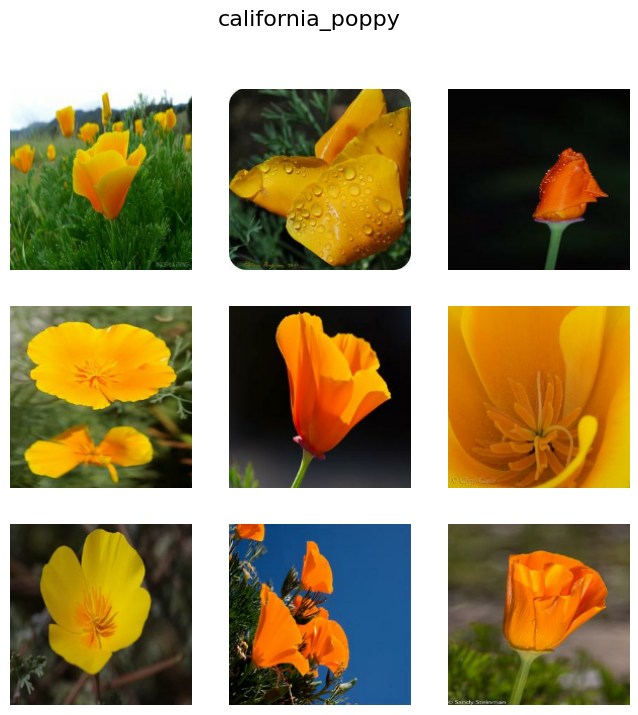

...

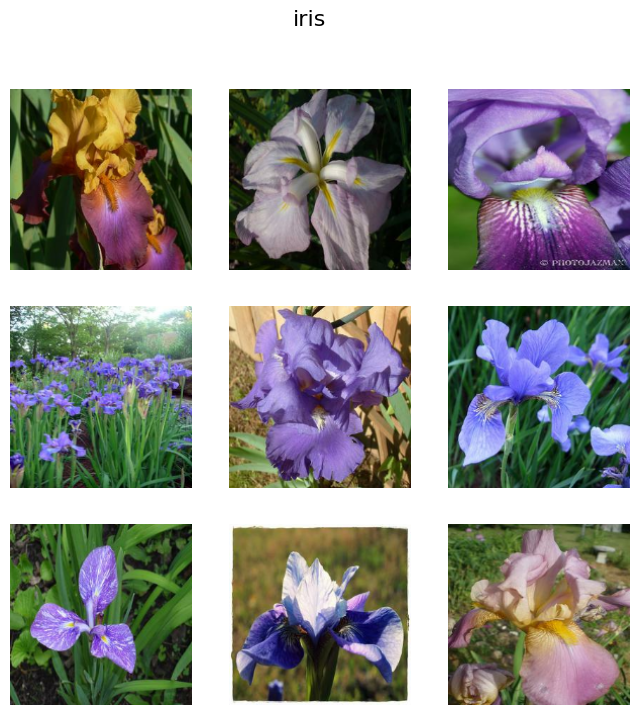

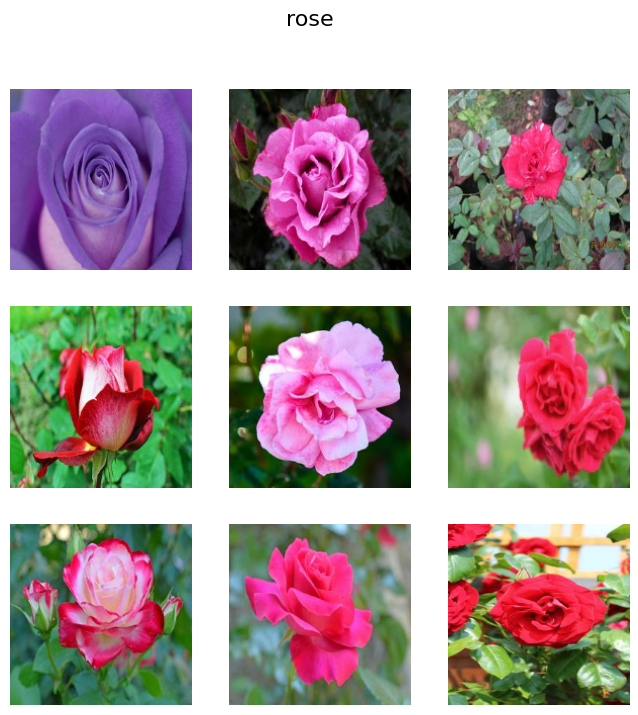

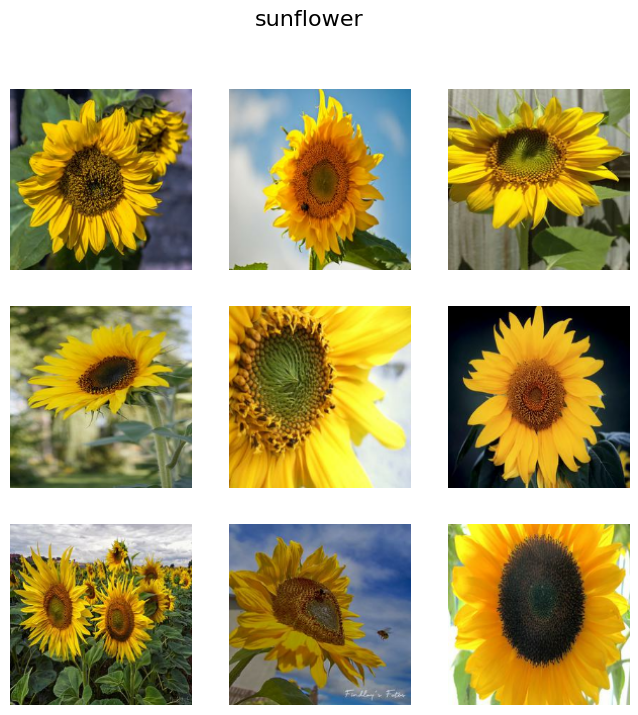

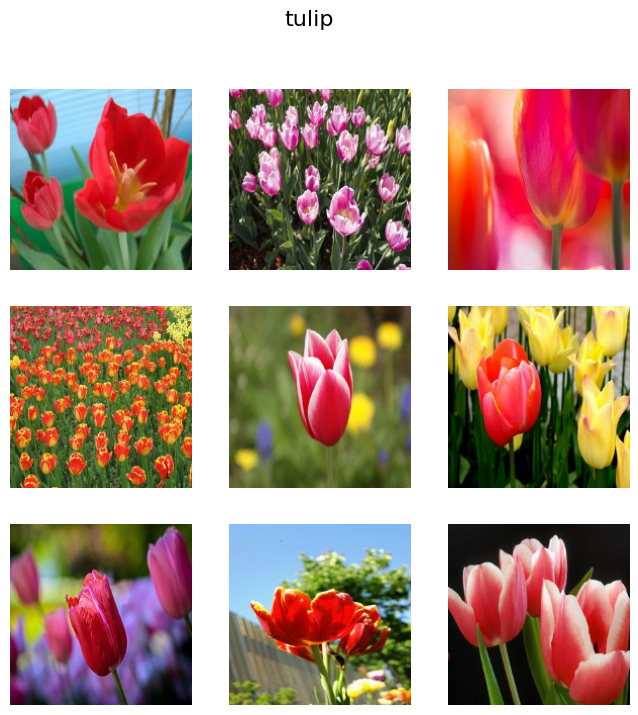

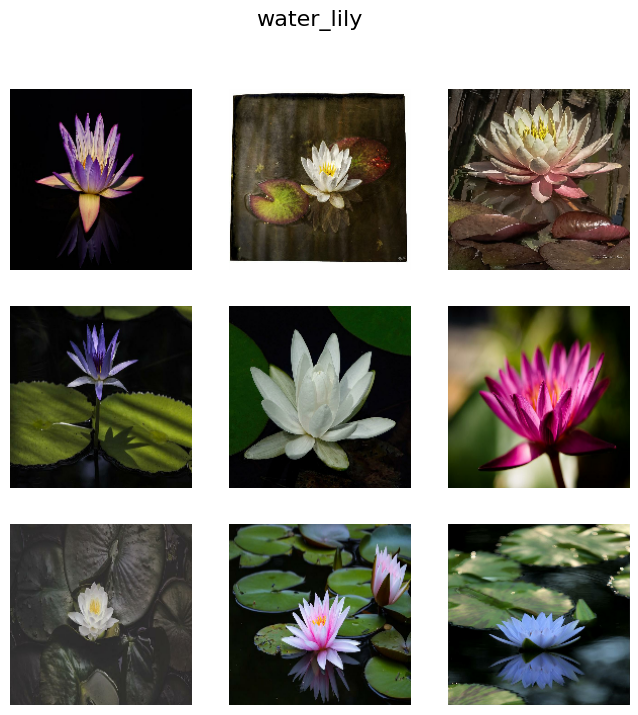

In [12]:
import matplotlib.pyplot as plt

# Function to visualize 3x3 grid of images per class
def visualize_images(dataset, class_names):
    for class_name in class_names:  # Loop through all classes
        class_images = []

        for images, labels in dataset:
            for img, label in zip(images.numpy(), labels.numpy()):
                if class_names[label] == class_name and len(class_images) < 9:
                    class_images.append(img)
            if len(class_images) == 9:
                break

        if len(class_images) == 9:
            fig, axes = plt.subplots(3, 3, figsize=(8, 8))
            fig.suptitle(class_name, fontsize=16)
            for ax, img in zip(axes.flat, class_images):
                ax.imshow(img.astype("uint8"))
                ax.axis("off")
            plt.show()

# Call function to visualize images
visualize_images(train_ds, class_names)

In [ ]:
# Exercise 2: Model Architecture Design

# - Experiment with the number of convolutional layers, filters, kernel sizes, and max-pooling layers.


In [13]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Définir les dimensions des images
img_height = 180
img_width = 180
num_classes = len(class_names)  # Assurez-vous que class_names est défini

# Définir l'architecture du modèle
def create_model():
    model = models.Sequential()
    # Première couche de convolution
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())
    # Deuxième couche de convolution
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())
    # Troisième couche de convolution
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())
    # Couche de flattening
    model.add(layers.Flatten())
    # Couche dense
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())
    # Couche de sortie
    model.add(layers.Dense(num_classes, activation='softmax'))
    return model

# Créer le modèle
model = create_model()

# Compiler le modèle
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Afficher le résumé du modèle
model.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 89, 89, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 43, 43, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 20, 20, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 51200)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       6,553,728 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 14)                  │           1,806 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 6,650,190 (25.37 MB)

 Trainable params: 6,649,486 (25.37 MB)

 Non-trainable params: 704 (2.75 KB)

In [14]:
import tensorflow as tf
from tensorflow.keras import layers, models

# Define image size and number of classes
img_height = 180
img_width = 180
num_classes = len(class_names)  # Make sure class_names is defined

# Define the modified model with additional convolutional layers
def create_deeper_model():
    model = models.Sequential()

    # First Convolutional Block
    model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Second Convolutional Block
    model.add(layers.Conv2D(64, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Third Convolutional Block
    model.add(layers.Conv2D(128, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Fourth Convolutional Block (New Layer)
    model.add(layers.Conv2D(256, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Fifth Convolutional Block (New Layer)
    model.add(layers.Conv2D(512, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Flattening
    model.add(layers.Flatten())

    # Fully Connected Layer
    model.add(layers.Dense(256, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

# Create the model
deeper_model = create_deeper_model()

# Compile the model
deeper_model.compile(optimizer='adam',
                     loss='sparse_categorical_crossentropy',
                     metrics=['accuracy'])

# Show the model summary
deeper_model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)                    │ (None, 178, 178, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 89, 89, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 89, 89, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 87, 87, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (None, 43, 43, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 43, 43, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 41, 41, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (None, 20, 20, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 20, 20, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 18, 18, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 9, 9, 256)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 9, 9, 256)           │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 7, 7, 512)           │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 3, 3, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 3, 3, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 4608)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_9                │ (None, 256)                 │           1,0

 Total params: 2,757,070 (10.52 MB)

 Trainable params: 2,754,574 (10.51 MB)

 Non-trainable params: 2,496 (9.75 KB)

- Added 4th & 5th convolutional layers: Helps extract more detailed features.
- Increased filters to 256 and 512: Captures complex textures and structures in images.
- Max-Pooling after each layer: Prevents overfitting & reduces computation.
- Batch Normalization after each layer: Stabilizes learning and helps faster convergence.

In [15]:
# Modified Model with Different Filters & Kernel Sizes

# Start with smaller filters (16 instead of 32) in early layers.
# Use larger kernel sizes (5×5) in later layers to capture broader patterns.

import tensorflow as tf
from tensorflow.keras import layers, models

# Define image size and number of classes
img_height = 180
img_width = 180
num_classes = len(class_names)  # Make sure class_names is defined

# Define the model with modified filters and kernel sizes
def create_modified_filters_model():
    model = models.Sequential()

    # First Convolutional Block - Smaller filters, standard kernel
    model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Second Convolutional Block - Increase filters, keep standard kernel
    model.add(layers.Conv2D(32, (3, 3), activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Third Convolutional Block - Increase filters, use larger kernel
    model.add(layers.Conv2D(64, (5, 5), activation='relu'))  # 5x5 Kernel
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Fourth Convolutional Block - Increase filters, keep larger kernel
    model.add(layers.Conv2D(128, (5, 5), activation='relu'))  # 5x5 Kernel
    model.add(layers.MaxPooling2D((2, 2)))
    model.add(layers.BatchNormalization())

    # Flattening
    model.add(layers.Flatten())

    # Fully Connected Layer
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dropout(0.5))
    model.add(layers.BatchNormalization())

    # Output Layer
    model.add(layers.Dense(num_classes, activation='softmax'))

    return model

# Create the model
modified_filters_model = create_modified_filters_model()

# Compile the model
modified_filters_model.compile(optimizer='adam',
                               loss='sparse_categorical_crossentropy',
                               metrics=['accuracy'])

# Show the model summary
modified_filters_model.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_8 (Conv2D)                    │ (None, 178, 178, 16)        │             448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 89, 89, 16)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_10               │ (None, 89, 89, 16)          │              64 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_9 (Conv2D)                    │ (None, 87, 87, 32)          │           4,640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_9 (MaxPooling2D)       │ (None, 43, 43, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_11               │ (None, 43, 43, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_10 (Conv2D)                   │ (None, 39, 39, 64)          │          51,264 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_10 (MaxPooling2D)      │ (None, 19, 19, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_12               │ (None, 19, 19, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_11 (Conv2D)                   │ (None, 15, 15, 128)         │         204,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_11 (MaxPooling2D)      │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_13               │ (None, 7, 7, 128)           │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │         802,944 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_14               │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 14)                  │           1,806 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,067,502 (4.07 MB)

 Trainable params: 1,066,766 (4.07 MB)

 Non-trainable params: 736 (2.88 KB)

- Started with smaller filters (16, 32 instead of 32, 64): Reduces initial computation, captures simple edges first.
- Used larger kernels (5×5) in deeper layers: Helps recognize larger features and textures.
- Kept Max-Pooling & Batch Normalization: Stabilizes training and reduces overfitting.

In [45]:
# # Train the model
# train_dir = '/content/Flower Classification/Data/train'
# val_dir = '/content/Flower Classification/Data/train'
# epochs = 15  # Change this if needed

# history = model.fit(
#     train_ds,
#     validation_data=val_dir,
#     epochs=epochs
# )


In [ ]:
# Exercise 4: Data Augmentation

In [16]:
# Implement data augmentation using ImageDataGenerator.
# first we load dataset normally

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Define image size and batch size
img_size = (180, 180)
batch_size = 32

# Define dataset path (Update this to your actual dataset path)
dataset_path = "Flower Classification"

# Data Augmentation for Training Set
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
    validation_split=0.2,  # Use 20% of data for validation
    rotation_range=0,  # No augmentation yet, we'll add it later
    width_shift_range=0,
    height_shift_range=0,
    shear_range=0,
    zoom_range=0,
    horizontal_flip=False,
    vertical_flip=False
)

# Load Training Dataset with Augmentation
train_dataset = train_datagen.flow_from_directory(
    dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',
    subset='training'
)

# Load Validation Dataset (No Augmentation)
val_datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2)
validation_dataset = val_datagen.flow_from_directory(
    dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',
    subset='validation'
)

# Confirm class names
class_names = train_dataset.class_indices
print("Classes:", class_names)


Found 10992 images belonging to 1 classes.
Found 2748 images belonging to 1 classes.
Classes: {'Data': 0}


In [17]:
# Data Augmentation for Training Set
train_datagen = ImageDataGenerator(
    rescale=1./255,  # Normalize pixel values
    rotation_range=30,  # Rotate images by up to 30 degrees
    width_shift_range=0.2,  # Shift width by 20%
    height_shift_range=0.2,  # Shift height by 20%
    shear_range=0.2,  # Apply shearing transformation
    zoom_range=0.2,  # Random zoom up to 20%
    horizontal_flip=True,  # Flip images horizontally
    vertical_flip=False,  # Vertical flip is usually not useful for natural images
    validation_split=0.2  # 20% validation split
)

# Load Training Dataset with Augmentation
train_dataset = train_datagen.flow_from_directory(
    dataset_path,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='sparse',
    subset='training'
)

print("Data Augmentation Applied to Training Set")


Found 10992 images belonging to 1 classes.
Data Augmentation Applied to Training Set


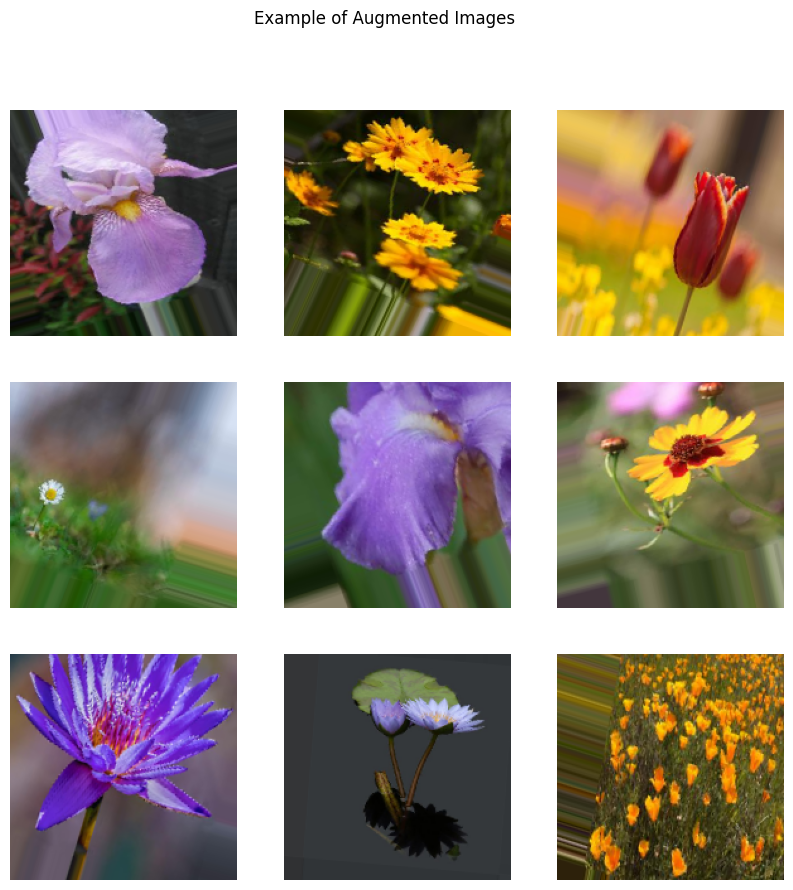

In [18]:
# Determine which augmentations are most effective for this dataset and explain why

import matplotlib.pyplot as plt
import numpy as np

# Get one batch of images
images, labels = next(train_dataset)

# Plot 9 images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(images[i])
    plt.axis("off")
plt.suptitle("Example of Augmented Images")
plt.show()

In [19]:
# How does augmentation improve generalization?
# Train the model with augmented dataset
epochs = 2  # Adjust as needed

history = model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=epochs
)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/2
344/344 ━━━━━━━━━━━━━━━━━━━━ 994s 3s/step - accuracy: 0.5288 - loss: 1.7580 - val_accuracy: 1.0000 - val_loss: 0.0185
Epoch 2/2
344/344 ━━━━━━━━━━━━━━━━━━━━ 999s 3s/step - accuracy: 0.9987 - loss: 0.0231 - val_accuracy: 1.0000 - val_loss: 0.0026


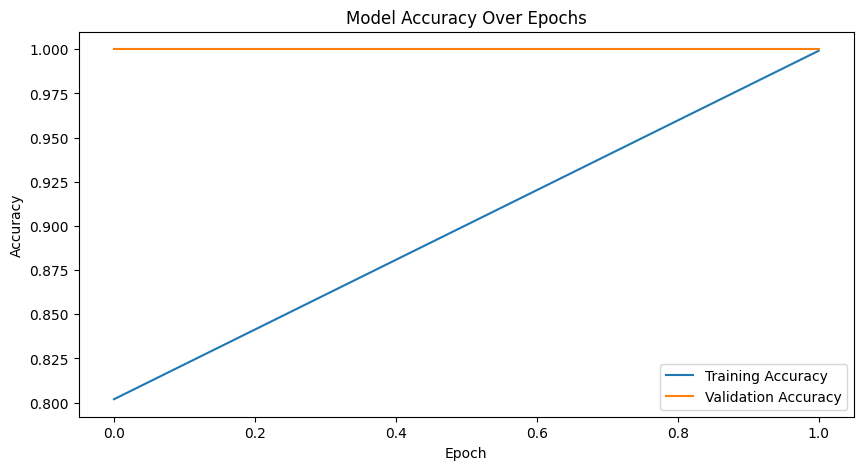

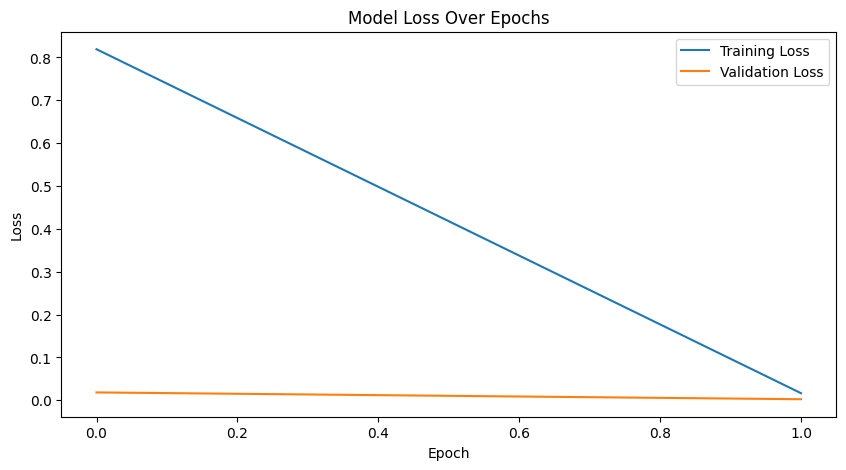

In [20]:
# Exercise 5: Plot Training & Validation Accuracy and Loss
# Plot the training and validation accuracy and loss curves. Analyze these plots for signs of overfitting or underfitting.

import matplotlib.pyplot as plt

# Plot Training & Validation Accuracy
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Model Accuracy Over Epochs')
plt.show()

# Plot Training & Validation Loss
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Model Loss Over Epochs')
plt.show()

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns

# Get true labels and predicted labels
true_labels = []
predicted_labels = []

for images, labels in validation_dataset:
    preds = model.predict(images)
    for i, pred in enumerate(preds):
        true_labels.append(labels[i])
        predicted_labels.append(np.argmax(pred))

# to Convert labels to NumPy arrays
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

#to  Compute classification report
class_report = classification_report(true_labels, predicted_labels, target_names=class_names)
print("Classification Report:\n", class_report)

# Compute confusion matrix
conf_matrix = confusion_matrix(true_labels, predicted_labels)

# Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, cmap="Blues", xticklabels=class_names, yticklabels=class_names, fmt="d")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix")
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 588ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 592ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 

In [ ]:
# Visualize the model’s predictions on a set of test images. Identify any misclassifications and try to understand why they occurred.

import random
from tensorflow.keras.preprocessing import image

# Load some test images
test_image_paths = ["path_to_test_image1.jpg", "path_to_test_image2.jpg", "path_to_test_image3.jpg"]  # Replace with real paths

# Plot predictions
plt.figure(figsize=(10, 5))
for i, img_path in enumerate(test_image_paths):
    # Load and preprocess image
    img = image.load_img(img_path, target_size=(180, 180))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # Expand to match model input shape

    # Predict
    predictions = model.predict(img_array)
    predicted_class = class_names[np.argmax(predictions)]
    confidence = np.max(predictions)

    # Display image
    plt.subplot(1, len(test_image_paths), i+1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Predicted: {predicted_class}\nConfidence: {confidence:.2f}")

plt.show()